# **Лабораторная работа 2**
*Naumov Anton (Any0019)*

*To contact me in telegram: @any0019*

В данном задании вашей задачей будет построить простую модель для задачи **Image Captioning** - по изображению (image) сгенерировать текстовый заголовок (caption)

В ноутбуке будет несколько оцениваемых частей:
1. **Подготовка данных для модели** (*4 балла*) --> требуется заполнить пропуски и составить пайплайн предобработки данных
2. **Построение модели** (*3 балла*) --> требуется заполнить пропуски и составить пайплайн сборки модели
3. **Обучение модели** (*3 балла*) --> требуется заполнить пропуски и составить пайплайн обучения модели
4. **Оценка результатов** (*2 балл*) --> требуется заполнить пропуски и получить предсказания модели
5. **Валидация качества** (*3+ баллов*) --> вам нужно будет обучить модель, чтобы превзойти определённые пороги на валидационной выборке. Эта часть задания подразумевает возможность получения дополнительных баллов: в остальном ноутбуке вы соберёте модель по некоторой моей рекомендации, а именно в этой части от вас мы ожидаем экспериментов. Попробуйте собрать свою модель, улучшить качество, попробовать другие архитектуры и концептуальные подходы, в общем - удачи! За хорошие попытки полагаются баллы сверх базовой стоимости дз.

**Структура данных:**
- Вместе с заданием вам предложен файл __dataset.tar.gz__ (смотрите первую ячейку кода в ноутбуке), в нём вы найдёте папку data, в которой присутствуют две папки с изображениями (**train** и **val**) в формате .png и два файла **captions_train.tsv** и **captions_val.tsv**
- В файлах captions находятся таблицы с 6 полями, разделёнными через **\t**, содержащими `img_id` (название файла с изображением в соответствующей папке) и `caption #1-#5` (5 текстовых заголовков для изображения __img_id__)
- **ВАЖНО!!!** Не используйте val в обучении модели, только в тестах, т.к. часть баллов в конце ноутбука будет выдаваться в зависимости от результатов вашей модели на val выборке и если вы будете учиться на val срезе, то **баллы за всю лабораторную будут аннулированы**

**Концепция простой модели**
- Будем рассматривать задачу предсказания следующего слова в предложении, имея изображение и предыдущие слова
- Для получения фичей из изображений будем использовать крупную свёрточную предобученную архитектуру
- Для получения фичей из текста будем использовать рекуррентную архитектуру с предобученными эмбеддингами, но чтобы передать внутрь этой модельки информацию из изображений будем в качестве hidden_0 передавать в них приведённые линейным слоем к нужному размеру фичи изображений
- Классификатор, завершающийся линейным слоем к размеру словаря над финальным набором фичей
- LogSoftmax + NLLLoss (или CrossEntropyLoss) для оценки предсказания

**Модели большие, подсчёты не быстрые - закладывайте время на обучение моделей**

**В ноутбуке будет какое-то количество assert-ов, их задача - подсказать вам, но совсем не всегда вы должны строго их проходить**

------------------------------

***Полезный комментарий:***

*Местами, в коде вы будете встречать выполнение bash скриптов - их легко распознать по комментарию `#!:bash` вверху ячейки.*

*Если вы пользуетесь датосферой, то оставьте как есть, всё сработает, а вот если Google colab или что-то ещё, то замените код скриптов так, чтобы каждая его строка начиналась с `!`.*

*К примеру:*

*Изначальный блок:*
```bash
#!:bash
ls -sh dataset.tar
file dataset.tar
```

*Заменённый блок:*
```bash
!ls -sh dataset.tar
!file dataset.tar
```

...вроде как сейчас второй вариант так же работает и в датасфере, но я не уверен

## 0. Скачиваем и распаковываем данные

In [6]:
%pip install --upgrade --no-cache-dir gdown

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: python3 -m pip install --upgrade pip


In [7]:
!python3 -m gdown --id 1d9WK2Kqb-r8d0fZoiJccTflXZbVGrUSq

/home/jupyter/.local/lib/python3.10/site-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1d9WK2Kqb-r8d0fZoiJccTflXZbVGrUSq
From (redirected): https://drive.usercontent.google.com/download?id=1d9WK2Kqb-r8d0fZoiJccTflXZbVGrUSq&confirm=t&uuid=8f147506-fefa-4343-9d08-51967457eb42
To: /home/jupyter/work/resources/ml2/dz2/s.tar.gz
100%|██████████| 2.53G/2.53G [00:26<00:00, 97.2MB/s]


In [3]:
# import gdown

# url = 'https://drive.google.com/uc?id=1d9WK2Kqb-r8d0fZoiJccTflXZbVGrUSq'
# output = 'dataset.tar.gz'
# gdown.download(url, output, quiet=False)

## 1. Подготовка данных (***4 балла***)

In [15]:
%ls

lab2_ic_student(1)(1).ipynb
s.tar.gz


In [17]:
!ls -sh s.tar.gz
!file s.tar.gz

2.4G s.tar.gz


/bin/sh: 10: file: not found


Exception: Process exited with code 127

In [23]:
#!:bash
!tar xfz s.tar.gz -C .

/bin/sh: 11: !tar: not found


Exception: Process exited with code 127

In [1]:
import torch
import cv2
import os
import pandas as pd
import numpy as np
from tqdm.auto import tqdm, trange
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
os.getcwd()

'/home/jupyter/work/resources/ml2/dz2'

In [3]:
data_folder = "/home/jupyter/work/resources/ml2/dz2/data"  # укажите здесь путь до распакованных данных

dfs = dict()
for split in ['train', 'val']:
    dfs[split] = pd.read_csv(os.path.join(data_folder, f'captions_{split}.tsv'), sep='\t')

dfs['train'].head()

,img_id,caption #0,caption #1,caption #2,caption #3,caption #4
0,0000.png,A child in a pink dress is climbing up a set o...,A girl going into a wooden building .,A little girl climbing into a wooden playhouse .,A little girl climbing the stairs to her playh...,A little girl in a pink dress going into a woo...
1,0001.png,A black dog and a spotted dog are fighting,A black dog and a tri-colored dog playing with...,A black dog and a white dog with brown spots a...,Two dogs of different breeds looking at each o...,Two dogs on pavement moving toward each other .
2,0002.png,A little girl covered in paint sits in front o...,A little girl is sitting in front of a large p...,A small girl in the grass plays with fingerpai...,There is a girl with pigtails sitting in front...,Young girl with pigtails painting outside in t...
3,0003.png,A man lays on a bench while his dog sits by him .,A man lays on the bench to which a white dog i...,a man sleeping on a bench outside with a white...,A shirtless man lies on a park bench with his ...,man laying on bench holding leash of dog sitti...
4,0004.png,A man in an orange hat starring at something .,A man wears an orange hat and glasses .,A man with gauges and glasses is wearing a Bli...,A man with glasses is wearing a beer can croch...,The man with pierced ears is wearing glasses a...


In [4]:
dfs['train'].shape

(6000, 6)

In [5]:
dfs['val'].shape

(1000, 6)

<class 'numpy.ndarray'>
(375, 500, 3)


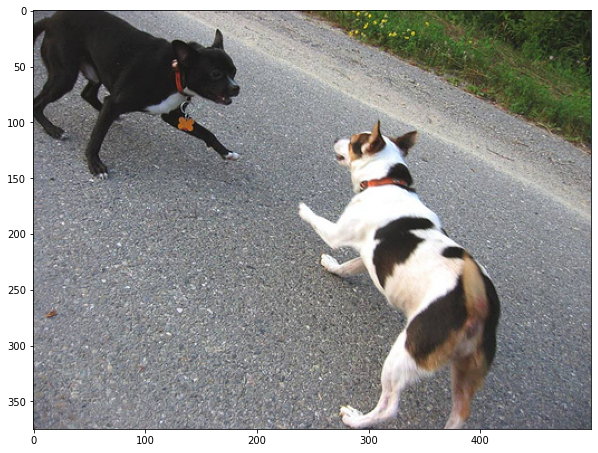

In [6]:
fig, ax = plt.subplots(figsize=(10,8))
# Для чтения изображений из файлов мы будем использовать библиотеку cv2 --> всё что вам нужно знать
#   функция cv2.imread(path) принимает на вход путь к файлу изображения и возвращает np.array с изображением
#   в порядке h x w x c
image = cv2.imread(os.path.join(data_folder, 'train', '0001.png'))
print(type(image))
print(image.shape)
plt.imshow(image)
plt.show()

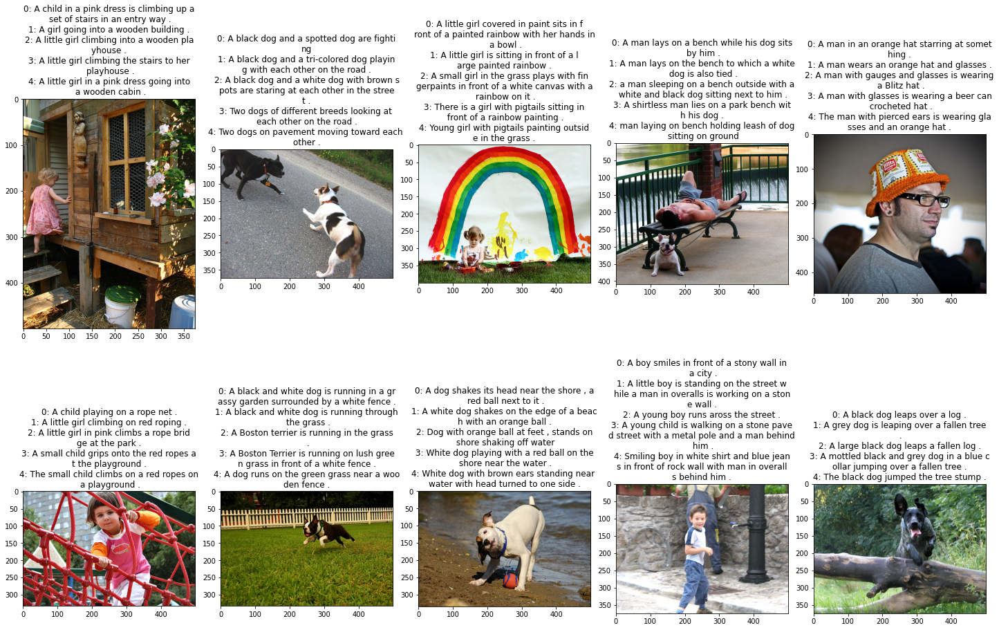

In [7]:
inds = list(range(10))
split = 'train'

h, w = 2, 5
title_width = 43

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['img_id']
    captions = [row[f'caption #{i}'] for i in range(5)]

    caption_adjasted = map(lambda el: '\n'.join([(str(el[0]) + ': ' + el[1])[k:k+title_width] for k in range(0, 3 + len(el[1]), title_width)]), enumerate(captions))
    caption = '\n'.join(caption_adjasted)
    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(cv2.imread(os.path.join(data_folder, split, img_id)))

fig.tight_layout()
plt.show()

### 1.2 Предобработка изображений

**Сперва напишем предобработку для изображений**

In [8]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as tr

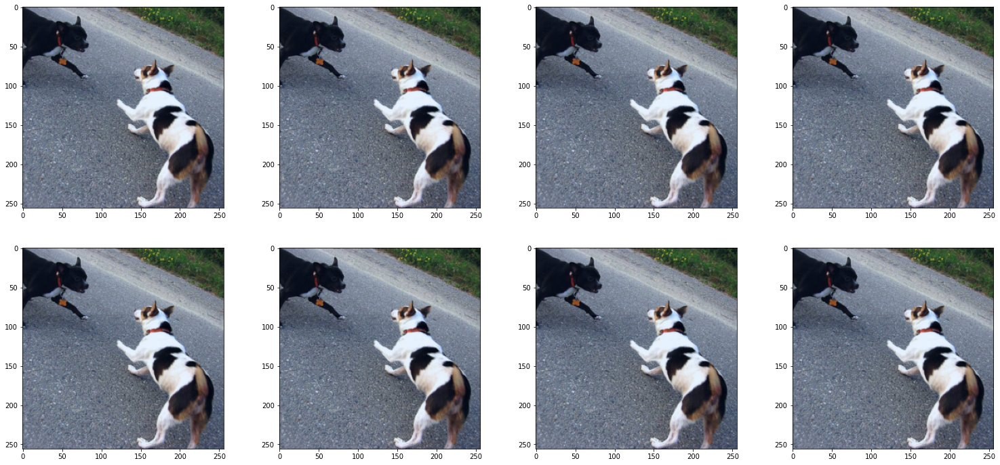

In [9]:
# Подготовьте функцию для аугументации одного изображения

# !!! Напомню, что в выборе аугументаций многое будет зависеть от того,
# !!!  на каких аугументациях училась предобученная модель, которую вы возьмёте,
# !!!  так что рекомендую принимать решение о финальных аугументациях после изучения
# !!!  выбранной вами модели

# Поканальное среднее и стандартное отклонение (как и откуда лучше взять?)
# вроде это обычные картинки, можно взять из ImageNet
channel_mean = np.array([0.485, 0.456, 0.406])
channel_std = np.array([0.229, 0.224, 0.225])
img_size = 256

image_prepare = tr.Compose([
    tr.ToPILImage(),
    # Любые преобразования, которые вы захотите:
    #   https://pytorch.org/vision/stable/transforms.html
    tr.Resize(img_size),
    tr.CenterCrop(img_size),
    tr.ToTensor(),
    tr.Normalize(mean=channel_mean, std=channel_std),
])

# Для валидации рекомендую использовать минимальное количество аугументаций, чтобы
#  замеряться честно - изменения размера, нормализация (все случайные аугументации
#  не делайте для валидации и обязательно для обучения делайте со средним в нуле)
image_prepare_val = tr.Compose([
    tr.ToPILImage(),
    tr.Resize(img_size),
    tr.CenterCrop(img_size),
    tr.ToTensor(),
    tr.Normalize(mean=channel_mean, std=channel_std),
])


# Визуализация ваших преобразований на одном изображении (проверка на адекватность)
from sklearn.preprocessing import minmax_scale

image = cv2.imread(os.path.join(data_folder, "train", "0001.png"))

def de_normalize(img):
    return minmax_scale(
        (img.reshape(3, -1) + channel_mean[:, None]) * channel_std[:, None],
        feature_range=(0., 1.),
        axis=1,
    ).reshape(*img.shape)

# Проверка на адекватность
fig, ax = plt.subplots(2, 4, figsize=(26, 12))
for i in range(8):
    plt.subplot(2, 4, i+1)
    transformed_image = image_prepare(image).numpy().transpose(1, 2, 0)
    to_show_image = de_normalize(transformed_image)
    plt.imshow(to_show_image)
plt.show()

### 1.3 Предобработка заголовков

**Затем напишем предобработку для заголовков**

Для простоты вычислений предлагаю сделать крайне простую токенизацию, пользуясь регулярными выражениями и библиотекой **re**

1. Приводим текст к нижнему регистру
2. Заменяем всю пунктуацию на пробелы
3. Убираем пробельные символы с концов строки
4. Разбиваем по ненулевой последовательности пробельных символов
5. Добавляем специальные токены \<BOS> (begining of sentence) и \<EOS> (end of sentence), чтобы обозначить границы заголовка для модели

In [10]:
import re
import string

def tokenize(text:str):
    ...
    text = text.lower()
    table = str.maketrans(string.punctuation, " " * len(string.punctuation))
    text = text.translate(table)
    text = re.sub('\s+', ' ', text)
    if text[-1] == ' ':
      text = text[:-1]
    text = text.split(" ")
    text.insert(0, "<BOS>")
    text.append("<EOS>")
    return text

# Проверка вашей функции
tokenize("My name is Any0019, I wish you good luck in this lab! Bye-bye :)")

['<BOS>',
 'my',
 'name',
 'is',
 'any0019',
 'i',
 'wish',
 'you',
 'good',
 'luck',
 'in',
 'this',
 'lab',
 'bye',
 'bye',
 '<EOS>']

Соберём словарь из всех слов, что встречаются в заголовках в train
1. Токенизируем заголовки
2. Обновляем частоту всех отдельных токенов
3. Выкидываем все слова встретившиеся меньше `MIN_FREQ` (допустим 3 - можете взять другое число) -> заменяем на специальный `<UNK>` (unknown) токен
4. Записываем быстрое преобразование из токенов в индексы и наоборот

In [11]:
dfs['train'].iloc[0]['caption #0']

'A child in a pink dress is climbing up a set of stairs in an entry way .'

In [12]:
from collections import Counter

  0%|          | 0/6000 [00:00<?, ?it/s]

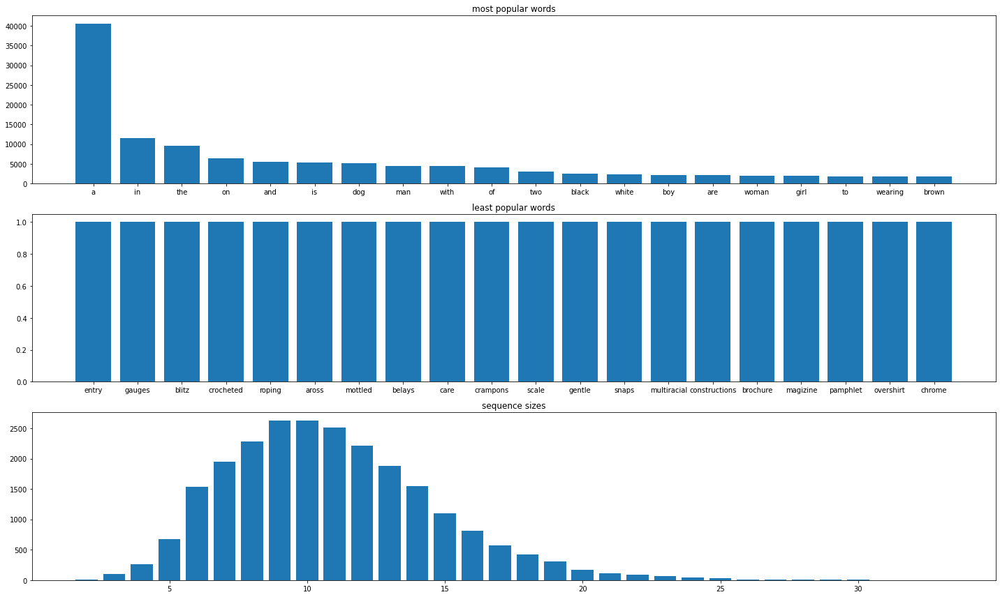

In [13]:
from tqdm.auto import trange
from collections import Counter, defaultdict

# Посчитаем частоту встречаемости различных токенов (не нужно для bos и eos)
vocab_freq = Counter()

# Параллельно заодно посчитаем длины заголовков в токенах (сколько раз встречалась какая длина в токенах)
#  sizes[5] = число заголовков из 5 токенов (без учёта bos и eos)
sizes = defaultdict(int)
for i in trange(len(dfs['train'])):
    for j in range(4):
      seq = tokenize(dfs['train'].iloc[i][f'caption #{j}'])
      vocab_freq.update(seq)
      sizes[len(seq) - 2] += 1

del vocab_freq['<EOS>']
del vocab_freq['<BOS>']
global_max_seq_len = np.max(list(sizes.keys()))

show_ = 20
fig, ax = plt.subplots(3, 1, figsize=(20, 12))

plt.subplot(312)
vocab_freq = {k: v for k, v in sorted(vocab_freq.items(), key=lambda item: item[1])}
plt.title('least popular words')
plt.bar(list(vocab_freq.keys())[:show_], list(vocab_freq.values())[:show_])

plt.subplot(311)
vocab_freq = {k: v for k, v in sorted(vocab_freq.items(), key=lambda item: item[1], reverse=True)}
plt.title('most popular words')
plt.bar(list(vocab_freq.keys())[:show_], list(vocab_freq.values())[:show_])

plt.subplot(313)
plt.title('sequence sizes')
plt.bar(list(sizes.keys()), list(sizes.values()))

fig.tight_layout()
plt.show()

In [14]:
global_max_seq_len += 2

In [15]:
MIN_FREQ = 3  # токены с частотой ниже этой константы заменяются на <UNK>

# Так же добавляем <PAD> токен для паддингов
tok_to_ind = {
    '<UNK>': 0,
    '<BOS>': 1,
    '<EOS>': 2,
    '<PAD>': 3,
}

ind_to_tok = {
    0: '<UNK>',
    1: '<BOS>',
    2: '<EOS>',
    3: '<PAD>',
}

# Заполнить оставшееся
...
i = 4
for k, v in vocab_freq.items():
  if v < MIN_FREQ:
    continue
  else:
    tok_to_ind[k] = i
    ind_to_tok[i] = k
    i += 1

assert len(tok_to_ind) == len(ind_to_tok)
vocab_size = len(tok_to_ind)
print(f"Resulting vocab size: {vocab_size} (out of {len(vocab_freq)} tokens overall, due to MIN_FREQ={MIN_FREQ})")

Resulting vocab size: 3113 (out of 6745 tokens overall, due to MIN_FREQ=3)


In [16]:
# Функция возвращает по тексту индексы токенов в тексте
def to_ids(text):
    return [tok_to_ind[i] if i in tok_to_ind else tok_to_ind['<UNK>'] for i in text]

text = "I really hope that you can get a lot of great results with this lab! You're awesome! I believe in you, good luck :)"
toks = tokenize(text)
ids = to_ids(toks)
print(list(zip(toks, ids)))

assert toks[0] == '<BOS>' and toks[-1] == '<EOS>'
assert ids[0] == tok_to_ind['<BOS>'] and ids[-1] == tok_to_ind['<EOS>']

[('<BOS>', 1), ('i', 1304), ('really', 2456), ('hope', 0), ('that', 151), ('you', 1267), ('can', 804), ('get', 371), ('a', 4), ('lot', 394), ('of', 13), ('great', 2924), ('results', 0), ('with', 12), ('this', 748), ('lab', 973), ('you', 1267), ('re', 0), ('awesome', 0), ('i', 1304), ('believe', 0), ('in', 5), ('you', 1267), ('good', 2475), ('luck', 0), ('<EOS>', 2)]


### 1.4 Датасет

In [17]:
pd.read_csv(os.path.join(data_folder, f'captions_train.tsv'), sep='\t')

,img_id,caption #0,caption #1,caption #2,caption #3,caption #4
0,0000.png,A child in a pink dress is climbing up a set o...,A girl going into a wooden building .,A little girl climbing into a wooden playhouse .,A little girl climbing the stairs to her playh...,A little girl in a pink dress going into a woo...
1,0001.png,A black dog and a spotted dog are fighting,A black dog and a tri-colored dog playing with...,A black dog and a white dog with brown spots a...,Two dogs of different breeds looking at each o...,Two dogs on pavement moving toward each other .
2,0002.png,A little girl covered in paint sits in front o...,A little girl is sitting in front of a large p...,A small girl in the grass plays with fingerpai...,There is a girl with pigtails sitting in front...,Young girl with pigtails painting outside in t...
3,0003.png,A man lays on a bench while his dog sits by him .,A man lays on the bench to which a white dog i...,a man sleeping on a bench outside with a white...,A shirtless man lies on a park bench with his ...,man laying on bench holding leash of dog sitti...
4,0004.png,A man in an orange hat starring at something .,A man wears an orange hat and glasses .,A man with gauges and glasses is wearing a Bli...,A man with glasses is wearing a beer can croch...,The man with pierced ears is wearing glasses a...
...,...,...,...,...,...,...
5995,5995.png,one brown and white dog chasing a black and wh...,The two dogs are running through the grass .,Two cocker spaniels running through the grass .,Two dogs are running through a green yard,Two dogs are running through the grass near a ...
5996,5996.png,A man does a wheelie on his bicycle on the sid...,A man is doing a wheelie on a mountain bike .,A man on a bicycle is on only the back wheel .,Asian man in orange hat is popping a wheelie o...,Man on a bicycle riding on only one wheel .
5997,5997.png,A group is sitting around a snowy crevasse .,A group of people sit atop a snowy mountain .,A group of people sit in the snow overlooking ...,Five children getting ready to sled .,Five people are sitting together in the snow .
5998,5998.png,A grey bird stands majestically on a beach whi...,A large bird stands in the water on the beach .,A tall bird is standing on the sand beside the...,A water bird standing at the ocean 's edge .,A white crane stands tall as it looks out upon...


**Сделаем класс датасета в стиле torch.utils.data.Dataset**

In [18]:
class ImageCaptioningDataset(Dataset):
    """
        imgs_path ~ путь к папке с изображениями
        captions_path ~ путь к .tsv файлу с заголовками изображений
    """
    def __init__(self, imgs_path, captions_path, train=True):
        super(ImageCaptioningDataset).__init__()
        # Читаем и записываем из файлов в память класса, чтобы быстро обращаться внутри датасета
        # Если не хватает памяти на хранение всех изображений, то подгружайте прямо во время __getitem__, но это замедлит обучение
        # Проведите всю предобработку, которую можно провести без потери вариативности датасета, здесь
        ...
        self.data = pd.read_csv(captions_path, sep='\t')
        self.img_size = 256
        self.transform = tr.Compose([
                      tr.ToPILImage(),
                      tr.Resize(self.img_size),
                      tr.CenterCrop(224),
                      tr.ToTensor(),
                      tr.Normalize(mean=np.array([0.485, 0.456, 0.406]), std=np.array([0.229, 0.224, 0.225])),
                  ])
        self.imgs_path = imgs_path

    def __getitem__(self, index):
      img_path = self.data['img_id'].iloc[index]
      img_path = os.path.join(self.imgs_path, img_path)
      image = cv2.imread(img_path)
      image = self.transform(image)

      captions = [to_ids(tokenize(self.data.iloc[index][f'caption #{j}'])) for j in range(4)]

      ...

      # Получаем предобработанное изображение (не забудьте отличие при train=True или train=False)
      ...

      # Берём все заголовки или только один случайный (случайность должна происходить при каждом вызове __getitem__,
      #  чтобы во время обучения вы в разных эпохах могли видеть разные заголовки для одного изображения)
      ...

      return image, captions

    def __len__(self):
        return self.data.shape[0]

In [19]:
ds_train = ImageCaptioningDataset(
    os.path.join(data_folder, 'train'),
    os.path.join(data_folder, f'captions_train.tsv'),
    train=True,
)

ds_val = ImageCaptioningDataset(
    os.path.join(data_folder, 'val'),
    os.path.join(data_folder, f'captions_val.tsv'),
    train=False,
)

In [20]:
img1, captions1 = ds_train[0]
img2, captions2 = ds_train[1]

# Изображения должны быть тензорами (желательно одного размера для удобства складывания в батч)
assert isinstance(img1, torch.Tensor)
assert isinstance(img2, torch.Tensor)
assert img1.shape == img2.shape  # может быть не так, только если вы понимаете что делаете
assert img1.shape[0] == 3
print(f"Размер изображения из датасета: {img1.shape}")

# На этом этапе предлагаю возвращать просто list-ы captions без паддинга
assert isinstance(captions1, list)
assert isinstance(captions2, list)

print(len(captions1), len(captions2))
# Если вы возвращаете все или >1 заголовков для каждого изображения
assert isinstance(captions1[0], list) and len(captions1) == len(captions2)
assert isinstance(captions1[0][0], int)
assert ind_to_tok[captions1[0][0]] == "<BOS>"
assert ind_to_tok[captions1[0][-1]] == "<EOS>"
print(f"Число заголовков для одного изображения: {len(captions1)}")

# Если вы возвращаете 1 случайный заголовок для каждого изоброажения
# assert isinstance(captions1[0], int)
# assert ind_to_tok[captions1[0]] == "<BOS>"
# assert ind_to_tok[captions1[-1]] == "<EOS>"

# Проверка что число элементов в датасете совпадает с соответствующим числом изображений
assert len(ds_train) == len(os.listdir(os.path.join(data_folder, 'train')))
assert len(ds_val) == len(os.listdir(os.path.join(data_folder, 'val')))

Размер изображения из датасета: torch.Size([3, 224, 224])
4 4
Число заголовков для одного изображения: 4


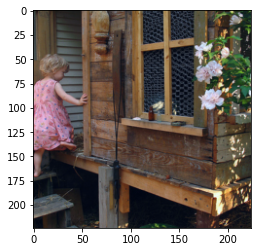

In [21]:
# Проверка на адекватность
plt.imshow(
    de_normalize(img1.numpy().transpose(1, 2, 0))
)
plt.show()

### 1.5 Даталоадер

In [22]:
# Здесь хотим задать кастомную функцию для того, как именно складывать данные в батч
# Эта функция позже будет передана в collate_fn аргумент даталоадера и будет отвечать за то,
#  как обработать батч и превратить его в тензоры нужного вида
def collate_fn(batch):
    # Функция получает на вход batch - представляет из себя List[el], где каждый el - один вызов __getitem__
    #  вашего датасета
    # На выход вы выдаёте то, что будет выдавать Dataloader на каждом next() из генератора - вы хотите иметь на выходе
    #  несколько тензоров

    # Моё предложение по тому как должен выглядеть батч на выходе:
    #   img_batch: [batch_size, num_channels, height, width] --> сложенные в батч изображения
    #   captions_batch: [batch_size, num_captions_per_image, max_seq_len or local_max_seq_len] --> сложенные в
    #       батч заголовки при помощи padding-а
    imgs, captions = zip(*batch)
    imgs_tensor = torch.stack(imgs, dim=0)
    padded_captions = []
    max_len = global_max_seq_len
    for i in range(len(captions)): # B
      for j in range(len(captions[i])): # 4
        captions[i][j] = captions[i][j] + [tok_to_ind['<PAD>']] * (max_len - len(captions[i][j]))
    padded_captions = torch.tensor(captions)
    return imgs_tensor, padded_captions

In [23]:
batch_size = 64
num_workers = 0

dataloader_train = DataLoader(
    dataset=ds_train,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=True,
    drop_last=True,
    num_workers=num_workers,
)

dataloader_val = DataLoader(
    dataset=ds_val,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=False,
    drop_last=False,
    num_workers=num_workers,
)

In [24]:
img_batch, captions_batch = next(iter(dataloader_train))

assert isinstance(img_batch, torch.Tensor)
assert isinstance(captions_batch, torch.Tensor)

assert img_batch.shape[:2] == torch.Size([batch_size, 3])
assert captions_batch.shape[0] == batch_size
assert len(captions_batch.shape) in [2, 3]

assert isinstance(captions_batch.reshape(-1)[0].item(), int)

print("Размер батча изображений: {}\nРазмер батча заголовков: {}".format(img_batch.shape, captions_batch.shape))

Размер батча изображений: torch.Size([64, 3, 224, 224])
Размер батча заголовков: torch.Size([64, 4, 35])


## 2. Составляем модель (***3 балла***)

[Картинка предложенной архитектуры модели для понимания](https://disk.yandex.ru/i/sHzk7LBP8-A5aQ)

<img src="https://disk.yandex.ru/i/sHzk7LBP8-A5aQ">

### 2.1 Фича-экстрактор для изображений

Возьмите какую-нибудь предобученную модель (к примеру resnet), по желанию заморозьте все или часть слоёв, наиболее вероятно уберите последний слой

```python
# выбрать веса нужной вам модели
weights = models.ResNet18_Weights.DEFAULT

# скачать нужную архитекутру модели и инициализировать её весами
model = models.resnet18(weights=weights, progress=True)

# посмотреть какие аугументации использовались в данной модели
weights.transforms()
```

In [25]:
from torchvision import models
weights = models.ResNet18_Weights.DEFAULT

# скачать нужную архитекутру модели и инициализировать её весами
model = models.resnet18(weights=weights, progress=True)

# посмотреть какие аугументации использовались в данной модели
weights.transforms()

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /tmp/xdg_cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:01<00:00, 44.0MB/s]


ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

In [26]:
from torchvision import models
from torch import nn

In [27]:
class img_fe_class(nn.Module):
    def __init__(self):
        super(img_fe_class, self).__init__()
        self.model = models.resnet18(weights=weights, progress=True).requires_grad_(False)

    def forward(self, imgs):
        for name, layer in self.model.named_children():
          if name != "fc":
            imgs = layer(imgs)
        return imgs.squeeze()

In [28]:
img_fe = img_fe_class()

img_features = img_fe(img_batch)
assert len(img_features.shape) == 2
assert img_features.shape[0] == img_batch.shape[0]

print(f'Для изображения возвращает {img_features.shape[1]} фичей')

Для изображения возвращает 512 фичей


### 2.2 Фича-экстрактор для текста

Давайте скачаем предобученные glove вектора и инициализируем nn.Embedding ими, там где мы их знаем

In [60]:
#!:bash
#wget -O glove.zip https://huggingface.co/stanfordnlp/glove/resolve/main/glove.840B.300d.zip

--2024-03-10 19:59:57--  https://huggingface.co/stanfordnlp/glove/resolve/main/glove.840B.300d.zip
Resolving huggingface.co (huggingface.co)... 18.172.242.104, 18.172.242.45, 18.172.242.49, ...
Connecting to huggingface.co (huggingface.co)|18.172.242.104|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs.huggingface.co/stanfordnlp/glove/f47355dd5b267bd10f08671e513790690233c76a9ffd73aa915d78f894a8912e?response-content-disposition=attachment%3B+filename*%3DUTF-8%27%27glove.840B.300d.zip%3B+filename%3D%22glove.840B.300d.zip%22%3B&response-content-type=application%2Fzip&Expires=1710359997&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTcxMDM1OTk5N319LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy5odWdnaW5nZmFjZS5jby9zdGFuZm9yZG5scC9nbG92ZS9mNDczNTVkZDViMjY3YmQxMGYwODY3MWU1MTM3OTA2OTAyMzNjNzZhOWZmZDczYWE5MTVkNzhmODk0YTg5MTJlP3Jlc3BvbnNlLWNvbnRlbnQtZGlzcG9zaXRpb249KiZyZXNwb25zZS1jb250ZW50LXR5cGU9KiJ9XX0_&Signature=S1

In [68]:
#!:bash
#wget -O glove.zip https://huggingface.co/stanfordnlp/glove/resolve/main/glove.840B.300d.zip
# mirror https://nlp.stanford.edu/data/wordvecs/glove.840B.300d.zip
#unzip glove.zip
ls -sh glove.*

5.3G glove.840B.300d.txt
2.1G glove.zip


In [29]:
# Открываем glove
np.random.seed(19)

def load_glove_weights(file_path, vocab, pad_token="<PAD>"):
    print("Loading Glove Weights")
    # Инициализируем веса для всех слов стандартным нормальным распределением
    glove_weights = np.random.uniform(0, 1, (len(vocab), 300))
    mask_found = np.zeros(len(vocab), dtype=bool)

    # Ищем среди слов в предобученном glove слова из нашего словаря
    with open(file_path, 'r') as f:
        for line in tqdm(f, total=2196018):
            line = line.split()
            token = ' '.join(line[:-300])
            embed = line[-300:]

            # Если нашли, то подменяем эмбеддинг из glove
            if token in vocab:
                ind = vocab[token]
                mask_found[ind] = True
                glove_weights[ind, :] = np.array(list(map(float, embed)), dtype='float')

    print(f"{mask_found.sum()} words from vocab of size {len(vocab)} loaded!")

    glove_weights[vocab[pad_token]] = np.zeros(300, dtype='float')
    return glove_weights, mask_found


glove_path = "glove.840B.300d.txt"
glove_weights, mask_found = load_glove_weights(glove_path, tok_to_ind, "<PAD>")

Loading Glove Weights


  0%|          | 0/2196018 [00:00<?, ?it/s]

3105 words from vocab of size 3113 loaded!


-----

Теперь, давайте составим рекурентную модельку для получения фичей из текстов с учётом картинок

Используйте эмбеддинги из картинок в качестве начального состояния скрытого слоя рекурентной нейросети (h_0), если размерности не совпадают, то линейный слой вам в помощь. Если в вашей rnn-like ячейке несколько слоёв, то подавайте в каждый из них.

Вам может пригодиться:

1. библиотека einops - один из самых удобных способов перетасовывать размерности в тензорах, пример:
```python
from einops import rearrange

a = torch.zeros(batch_size, num_captions, max_seq_length, emb_size)
b = rearrange(a, "bs cap seq emb -> (bs cap) seq emb")  # (batch_size * num_captions, max_seq_length, emb_size)
c = rearrange(b, "(bs cap) seq emb -> bs cap seq emb", cap=num_captions)  # (batch_size, num_captions, max_seq_length, emb_size)
```

2. torch.Tensor.repeat() - размножить тензор вдоль одной из размерностей, пример:
```python
a = torch.zeros(3, 5)
b = a[None, :, None, :]  # (1, 3, 1, 5)
c = b.repeat(2, 1, 4, 2)  # (2, 3, 4, 10)
```

In [30]:
captions_batch.shape, img_features.shape

(torch.Size([64, 4, 35]), torch.Size([64, 512]))

In [71]:
!pip install einops

pip is disabled in bash. Please use %pip magic.


Exception: Process exited with code 1

In [153]:
# #from einops import rearrange
from torch.autograd import Variable

class text_fe_class(nn.Module):
    def __init__(self, glove_weights):
        super(text_fe_class, self).__init__()

        ...

        self.embed = nn.Embedding(num_embeddings=vocab_size, embedding_dim=300, padding_idx=tok_to_ind['<PAD>'])
        self.embed.weight = nn.Parameter(
            torch.from_numpy(glove_weights).to(dtype=self.embed.weight.dtype),
            requires_grad=True,
        )

        self.model = nn.RNN(input_size=300, hidden_size=512, batch_first=True)

        ...

    def forward(self, texts, img_features):
        device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
        embedded = self.embed(texts)

        h0 = Variable(torch.zeros(1, texts.shape[0], 512)).to(device) # 1 64 512

        h0[0, :, :] = img_features

        rnn_outputs = []
        for i in range(texts.shape[1]):
            rnn_output, _ = self.model(embedded[:, i], h0)
            rnn_outputs.append(rnn_output)

        ans = torch.stack(rnn_outputs, 1)
        return ans


In [154]:
captions_batch.shape, img_features.shape

(torch.Size([64, 4, 35]), torch.Size([64, 512]))

In [155]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

text_fe = text_fe_class(glove_weights).to(device)
text_features = text_fe(captions_batch.to(device), img_features.to(device))

assert text_features.shape[:-1] == captions_batch.shape
assert len(text_features.shape) in [3, 4]
assert len(text_features.shape) == len(captions_batch.shape) + 1

print(captions_batch.shape)
print(img_features.shape)
print(text_features.shape)

torch.Size([64, 4, 35])
torch.Size([64, 512])
torch.Size([64, 4, 35, 512])


### 2.3 Финальная модель

In [156]:
from collections import OrderedDict

# class image_captioning_model(nn.Module):
#     def __init__(self, glove_weights):
#         super(image_captioning_model, self).__init__()
#         self.img_fe = img_fe_class()
#         self.text_fe = text_fe_class(glove_weights)
#         self.fc = nn.Linear(512, vocab_size)

#     def forward(self, img_batch, texts_batch):
#         img_features = self.img_fe(img_batch)
#         res = self.text_fe(texts_batch, img_features)
#         res0 = nn.functional.log_softmax(self.fc(res[:, 0]), -1)
#         res1 = nn.functional.log_softmax(self.fc(res[:, 1]), -1)
#         res2 = nn.functional.log_softmax(self.fc(res[:, 2]), -1)
#         res3 = nn.functional.log_softmax(self.fc(res[:, 3]), -1)
#         res_out = torch.stack([res0, res1, res2, res3], 1)
#         return res_out


class image_captioning_model(nn.Module):
    def __init__(self, glove_weights):
        super(image_captioning_model, self).__init__()
        self.img_fe = img_fe_class()
        self.text_fe = text_fe_class(glove_weights)
        self.fc = nn.Linear(512, vocab_size)

    def forward(self, img_batch, texts_batch):
        img_features = self.img_fe(img_batch)
        res = self.text_fe(texts_batch, img_features)
        logits = self.fc(res)  # No need to slice per position
        
        # Apply log_softmax to the entire sequence
        res_out = nn.functional.log_softmax(logits, -1)
        
        return res_out

In [157]:
captions_batch.shape

torch.Size([64, 4, 35])

In [158]:
model = image_captioning_model(glove_weights).to(device)

res = model(img_batch.to(device), captions_batch.to(device))
assert res.shape[:-1] == captions_batch.shape
assert res.shape[-1] == vocab_size

print(res.shape)


torch.Size([64, 4, 35, 3113])


In [123]:
from termcolor import colored
from collections import defaultdict

def beautiful_int(i):
    i = str(i)
    return ".".join(reversed([i[max(j, 0):j+3] for j in range(len(i) - 3, -3, -3)]))

# Считаем общее число параметров в нашей модели
def model_num_params(model, verbose_all=True, verbose_only_learnable=False):
    sum_params = 0
    sum_learnable_params = 0
    submodules = defaultdict(lambda : [0, 0])
    for name, param in model.named_parameters():
        num_params = np.prod(param.shape)
        if verbose_all or (verbose_only_learnable and param[1].requires_grad):
            print(
                colored(
                    '{: <42} ~  {: <9} params ~ grad: {}'.format(
                        name,
                        beautiful_int(num_params),
                        param.requires_grad,
                    ),
                    {True: "green", False: "red"}[param[1].requires_grad],
                )
            )
        sum_params += num_params
        sm = name.split(".")[0]
        submodules[sm][0] += num_params
        if param.requires_grad:
            sum_learnable_params += num_params
            submodules[sm][1] += num_params
    print(
        f'\nIn total:\n  - {beautiful_int(sum_params)} params\n  - {beautiful_int(sum_learnable_params)} learnable params'
    )

    for sm, v in submodules.items():
        print(
            f"\n . {sm}:\n .   - {beautiful_int(submodules[sm][0])} params\n .   - {beautiful_int(submodules[sm][1])} learnable params"
        )
    return sum_params, sum_learnable_params


sum_params, sum_learnable_params = model_num_params(model)

img_fe.model.conv1.weight                  ~  9.408     params ~ grad: False
img_fe.model.bn1.weight                    ~  64        params ~ grad: False
img_fe.model.bn1.bias                      ~  64        params ~ grad: False
img_fe.model.layer1.0.conv1.weight         ~  36.864    params ~ grad: False
img_fe.model.layer1.0.bn1.weight           ~  64        params ~ grad: False
img_fe.model.layer1.0.bn1.bias             ~  64        params ~ grad: False
img_fe.model.layer1.0.conv2.weight         ~  36.864    params ~ grad: False
img_fe.model.layer1.0.bn2.weight           ~  64        params ~ grad: False
img_fe.model.layer1.0.bn2.bias             ~  64        params ~ grad: False
img_fe.model.layer1.1.conv1.weight         ~  36.864    params ~ grad: False
img_fe.model.layer1.1.bn1.weight           ~  64        params ~ grad: False
img_fe.model.layer1.1.bn1.bias             ~  64        params ~ grad: False
img_fe.model.layer1.1.conv2.weight         ~  36.864    params ~ grad: False

## 3. Пайплайн обучения (***3 балла***)

### 3.1 Оптимайзер

In [124]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

def create_model_and_optimizer(model_class, model_params, device=device):
    model = model_class(model_params)
    model = model.to(device)

    optimizer = torch.optim.Adam(model.parameters())
    return model, optimizer

# Убедитесь что всё сработало и создалось нормально и без ошибок
model, optimizer = create_model_and_optimizer(
    image_captioning_model,
    glove_weights,
    device=device
)

### 3.2 Один шаг обучения/валидации

Помните что captions вы используете и как input (`captions[..., seq->0:-1, ...]`) в модель и как target (`captions[..., seq->1:None, ...]`)

In [125]:
img, captions_batch = next(iter(dataloader_train))
img = img.to(device)
inp = captions_batch[:, :, 0:-1].to(device)
target = captions_batch[:, :, 1:None].to(device)

In [126]:
model = model.to(device)
loss = nn.NLLLoss()
pred = model(img, inp)

In [127]:
pred.shape

torch.Size([64, 4, 34, 3113])

In [128]:
pred_0 = pred[:, 0]
pred_1 = pred[:, 1]
pred_2 = pred[:, 2]
pred_3 = pred[:, 3]

target_0 = target[:, 0]
target_1 = target[:, 1]
target_2 = target[:, 2]
target_3 = target[:, 3]

In [129]:
pred_0.shape, target_0.shape

(torch.Size([64, 34, 3113]), torch.Size([64, 34]))

In [130]:
torch.topk(pred_0[0], dim=-1, k=2)[1].shape, target_0[0].shape

(torch.Size([34, 2]), torch.Size([34]))

In [131]:
target_0[0] in torch.topk(pred_0[0], dim=-1, k=1)[1].reshape(34)

False

In [132]:
metric_names = {
        "accuracy": {"top": [1, 5], "plot_id": 1},
    }

metrics = defaultdict(list)
for k in metric_names["accuracy"]["top"]:
                        metrics[f'accuracy ~ top#{k}'].append(
                            np.mean([target_0[i] in torch.topk(pred_0[i],dim=-1, k=k)[1][:, k-1]  for i in range(target_0.shape[0])]) +
                            np.mean([target_1[i] in torch.topk(pred_1[i],dim=-1, k=k)[1][:, k-1]  for i in range(target_1.shape[0])]) +
                            np.mean([target_2[i] in torch.topk(pred_2[i],dim=-1, k=k)[1][:, k-1]  for i in range(target_2.shape[0])]) +
                            np.mean([target_3[i] in torch.topk(pred_3[i],dim=-1, k=k)[1][:, k-1]  for i in range(target_3.shape[0])])
                        )

In [133]:
metrics

defaultdict(list,
            {'accuracy ~ top#1': [0.015625], 'accuracy ~ top#5': [0.015625]})

In [134]:
from collections import defaultdict

def train(model, opt, loader, criterion):
    model.train()
    losses_tr = []
    loss_fn = criterion
    for img_batch, captions_batch in tqdm(loader):
        img_batch = img_batch.to(device)
        captions_batch = captions_batch


        optimizer.zero_grad()

        inp = captions_batch[:, :, 0:-1].to(device)
        pred = model(img_batch, inp)
        target = captions_batch[:, :, 1:].to(device)

        loss = loss_fn(pred.reshape(-1, vocab_size), target.reshape(-1))
        loss.backward()
        optimizer.step()
        losses_tr.append(loss.item())

    return model, optimizer, np.mean(losses_tr)


def val(model, loader, criterion, metric_names=None):
    model.eval()
    losses_val = []
    loss_fn = criterion
    if metric_names is not None:
        metrics = defaultdict(list)
    with torch.no_grad():
        for img_batch, captions_batch in tqdm(loader):
            img_batch = img_batch.to(device)
            captions_batch = captions_batch.to(device)

            inp = captions_batch[:, :, 0:-1].to(device)
            pred = model(img_batch, inp)
            target = captions_batch[:, :, 1:].to(device)

            loss = loss_fn(pred.reshape(-1, vocab_size), target.reshape(-1))

            losses_val.append(loss.item())

            pred_0 = pred[:, 0]
            pred_1 = pred[:, 1]
            pred_2 = pred[:, 2]
            pred_3 = pred[:, 3]

            target_0 = target[:, 0]
            target_1 = target[:, 1]
            target_2 = target[:, 2]
            target_3 = target[:, 3]
            # Можете добавить сюда любые метрики, которые хочется (см. код здесь и 3.3 за подробностями)
            if metric_names is not None:
                if 'accuracy' in metric_names:
                    preds = torch.argsort(pred, dim=-1, descending=True)
                    for k in metric_names["accuracy"]["top"]:
                        metrics[f'accuracy ~ top#{k}'].append(
                            np.mean([
                                    np.mean([target[i] in torch.topk(pred[i], dim=-1, k=k)[1][:, k-1] for i in range(target.shape[0])])
                                    for target, pred in zip([target_0, target_1, target_2, target_3], [pred_0, pred_1, pred_2, pred_3])
                                ])
                        )

        if metric_names is not None:
            for name in metrics:
                metrics[name] = np.mean(metrics[name])

    return np.mean(losses_val), metrics if metric_names else None

### 3.3 Цикл обучения

In [135]:
from IPython.display import clear_output
import warnings
import time
from datetime import timedelta

def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']


def learning_loop(
    model,
    optimizer,
    train_loader,
    val_loader,
    criterion,
    scheduler=None,
    min_lr=None,
    epochs=10,
    val_every=1,
    draw_every=1,
    separate_show=False,
    model_name=None,
    chkp_folder="./chkps",
    metric_names=None,
):
    # Выбираем куда будем сохранять модель
    if model_name is None:
        if os.path.exists(chkp_folder):
            num_starts = len(os.listdir(chkp_folder)) + 1
        else:
            num_starts = 1
        model_name = f'model#{num_starts}'
    else:
        if "#" not in model_name:
            model_name += "#0"
    changed = False
    while os.path.exists(os.path.join(chkp_folder, model_name + '.pt')):
        model_name, ind = model_name.split("#")
        model_name += f"#{int(ind) + 1}"
        changed = True
    if changed:
        warnings.warn(f"Selected model_name was used already! To avoid possible overwrite - model_name changed to {model_name}")

    # Инициализируем переменные
    losses = {'train': [], 'val': []}
    lrs = []
    best_val_loss = np.Inf
    if metric_names is not None:
        metrics = defaultdict(list)
    start_time = time.monotonic()

    # Цикл обучения
    for epoch in range(1, epochs+1):
        print(f'#{epoch}/{epochs}:')

        lrs.append(get_lr(optimizer))

        model, optimizer, loss = train(model, optimizer, train_loader, criterion)
        losses['train'].append(loss)

        # Каждые val_every эпох проводим валидацию
        if not (epoch % val_every):
            loss, metrics_ = val(model, val_loader, criterion, metric_names=metric_names)
            losses['val'].append(loss)
            if metrics_ is not None:
                for name, value in metrics_.items():
                    metrics[name].append(value)

            # Сохраняем лучшую по валидации модель
            if loss < best_val_loss:
                if not os.path.exists(chkp_folder):
                    os.makedirs(chkp_folder)
                torch.save(
                    {
                        'epoch': epoch,
                        'model_state_dict': model.state_dict(),
                        'optimizer_state_dict': optimizer.state_dict(),
                        'scheduler_state_dict': scheduler.state_dict(),
                        'losses': losses,
                    },
                    os.path.join(chkp_folder, model_name + '.pt'),
                )
                best_val_loss = loss

            # Шаг шедулера
            if scheduler:
                try:
                    scheduler.step()
                except:
                    scheduler.step(loss)

        # Каждые draw_every эпох рисуем графики
        if not (epoch % draw_every):
            clear_output(True)
            ww = 3 if separate_show else 2
            ww_metrics = 0
            if metric_names is not None:
                plot_ids_ = [
                    [key, metric_meta.get("plot_id", 1), metric_meta]
                    for key, metric_meta
                    in metric_names.items()
                ]
                ww_metrics = len(set(el[1] for el in plot_ids_))
                assert all(isinstance(el[1], int) for el in plot_ids_)
                assert all(el[1] <= ww_metrics for el in plot_ids_)
                assert all(el[1] >= 1 for el in plot_ids_)

                plot_ids = defaultdict(list)
                for el in plot_ids_:
                    plot_ids[el[1]].append((el[0], el[2]))

            fig, ax = plt.subplots(1, ww + ww_metrics, figsize=(30, 10))
            fig.suptitle(f'#{epoch}/{epochs} ~ {timedelta(seconds=time.monotonic() - start_time)}')

            plt.subplot(1, ww + ww_metrics, 1)
            plt.plot(losses['train'], 'r.-', label='train')
            if separate_show:
                plt.title('loss on train')
                plt.legend()
            plt.grid()

            if separate_show:
                plt.subplot(1, ww + ww_metrics, 2)
                plt.title('loss on validation')
                plt.grid()
            else:
                plt.title('losses')
            plt.plot(losses['val'], 'g.-', label='val')
            plt.legend()

            plt.subplot(1, ww + ww_metrics, ww)
            plt.title('learning rate')
            plt.plot(lrs, 'g.-', label='lr')
            plt.yscale("log")
            plt.legend()
            plt.grid()

            if metric_names is not None:
                for plot_id, keys_meta in plot_ids.items():
                    aggregated_meta = {}
                    plt.subplot(1, ww + ww_metrics, ww + plot_id)
                    if len(keys_meta) > 1:
                        plt.title(f'additional metrics #{plot_id}')
                    elif len(keys_meta) == 1:
                        plt.title(keys_meta[0][0])
                    for key_meta in keys_meta:
                        key, meta = key_meta
                        for meta_key in ["yscale"]:
                            if meta_key in meta:
                                assert meta_key not in aggregated_meta, f"Bad meta data '{meta_key}' doubled inside one plot_id ({plot_id})"
                                aggregated_meta[meta_key] = meta[meta_key]
                        for name in metrics:
                            if key in name:
                                plt.plot(metrics[name], '.-', label=name)
                    plt.yscale(aggregated_meta.get("yscale", "linear"))
                    plt.legend()
                    plt.grid()
            plt.show()

        # early_stopping - останавливаем обучение, если LR упал ниже min_lr
        if min_lr and get_lr(optimizer) <= min_lr:
            print(f'Learning process ended with early stop after epoch {epoch}')
            break

    return model, optimizer, losses

### 3.4 Обучаем модель

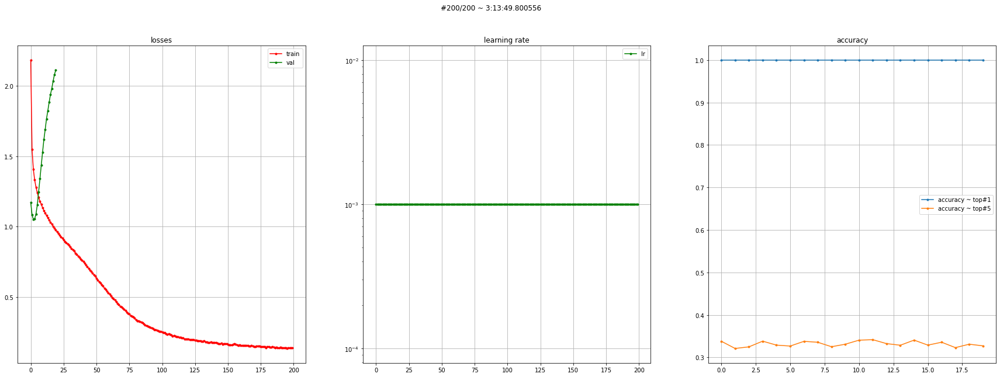

CPU times: user 5h 19min 50s, sys: 8min 25s, total: 5h 28min 16s
Wall time: 3h 13min 50s


In [212]:
%%time
from torch.optim.lr_scheduler import StepLR

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model, optimizer = create_model_and_optimizer(image_captioning_model,
    glove_weights,
    device=device)

scheduler = StepLR(optimizer, step_size=30, gamma=0.1)

criterion = nn.NLLLoss()

model, optimizer, losses = learning_loop(
    model = model,
    optimizer = optimizer,
    train_loader = dataloader_train,
    val_loader = dataloader_val,
    criterion = criterion,
    scheduler = scheduler,
    epochs = 200,
    min_lr = 0.00001,
    val_every = 10,
    draw_every = 20,
    separate_show = False,
    metric_names = {
        "accuracy": {"top": [1, 5], "plot_id": 1},
    },
    chkp_folder = "./chkp",
    model_name = "default",
)

### 3.5 Загрузка чекпоинта

#### **Не запускайте этот блок, если не понимаете для чего это в данную секунду!**

#### **Так можно случайно перезатереть несколько часов вычислений, если не скопировать их в отдельную переменную/чекпоинт**

In [195]:
#assert False, "Are you sure? If not - stop right here, otherwise - comment this assert line"

model_name = "default#3"
checkpoint = torch.load(os.path.join("./chkp", f"{model_name}.pt"))

# Создаём те же классы, что и внутри чекпоинта
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

model, optimizer = create_model_and_optimizer(image_captioning_model,
    glove_weights,
    device=device)

scheduler = StepLR(optimizer, step_size=30, gamma=0.1)

# Загружаем состояния из чекпоинта
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
epoch = checkpoint['epoch']
losses = checkpoint['losses']

## 4. Оценка результатов (***2 балл***)

### 4.1 Генерация

In [223]:
row = dfs[split].iloc[0]
img_id = row['img_id']
img = cv2.imread(os.path.join(data_folder, split, img_id))
_, pred_caption = generate(model, img)
print(pred_caption)

tensor([[-10.2177, -27.6874, -16.9141,  ..., -22.9760, -24.5304, -30.6228]],
       device='cuda:0')
tensor([[-10.2177, -27.6874, -16.9141,  ..., -22.9760, -24.5304, -30.6228],
        [ -8.7991, -27.4977, -49.0983,  ..., -30.2176, -24.8826, -24.4902]],
       device='cuda:0')
tensor([[-10.2177, -27.6874, -16.9141,  ..., -22.9760, -24.5304, -30.6228],
        [ -8.7991, -27.4977, -49.0983,  ..., -30.2176, -24.8826, -24.4902],
        [ -8.8556, -30.6430, -49.2710,  ..., -30.9247, -22.9146, -26.7232]],
       device='cuda:0')
tensor([[-10.2177, -27.6874, -16.9141,  ..., -22.9760, -24.5304, -30.6228],
        [ -8.7991, -27.4977, -49.0983,  ..., -30.2176, -24.8826, -24.4902],
        [ -8.8556, -30.6430, -49.2710,  ..., -30.9247, -22.9146, -26.7232],
        [ -8.7992, -28.8372, -18.9971,  ..., -30.6753, -24.3579, -24.9189]],
       device='cuda:0')
tensor([[-10.2177, -27.6874, -16.9141,  ..., -22.9760, -24.5304, -30.6228],
        [ -8.7991, -27.4977, -49.0983,  ..., -30.2176, -24.8826,

In [260]:
from typing import Optional

def generate(
    model,
    image,
    max_seq_len: Optional[int] = global_max_seq_len,
    top_p: Optional[float] = None,
    top_k: Optional[int] = None,
):
    """
    По картинке image генерируете текст моделью model либо пока не сгенерируете '<EOS>' токен, либо пока не сгенерируете max_seq_len токенов
        top_k -> после получения предсказания оставляете первые top_k слов и сэмплируете случайно с перенормированными вероятностями из оставшихся слов
        top_p -> после получения предсказания оставляете первые сколько-то слов, так, чтобы суммарная вероятность оставшихся слов была не больше top_p,
            после чего сэмплируете с перенормированными вероятностями из оставшихся слов
        иначе -> сэмплируете случайное слово с предсказанными вероятностями
    """
    assert top_p is None or top_k is None, "Don't use top_p and top_k at the same time"

    model.eval()
    transform = tr.Compose([
                  tr.ToPILImage(),
                  tr.Resize(256),
                  tr.CenterCrop(224),
                  tr.ToTensor(),
                  tr.Normalize(mean=np.array([0.485, 0.456, 0.406]), std=np.array([0.229, 0.224, 0.225])),
              ])
    image = transform(image).to(device) #3 224 224
    image = image.unsqueeze(0)
    new_word = tok_to_ind["<BOS>"]
    ans = [new_word]
    with torch.no_grad():
            while len(ans) < max_seq_len and new_word != tok_to_ind["<EOS>"]:
                current_token = torch.tensor(ans, device=image.device)
                current_token = current_token.unsqueeze(0)
                current_token = current_token.unsqueeze(0)
                pred = model(image, current_token)
                pred = pred.squeeze(0)
                pred = pred.squeeze(0)
                new_word = torch.argmax(pred[-1, :])
                ans.append(new_word.item())
    result_text = " ".join([ind_to_tok[token] for token in ans[1:-1]])
    return [ind_to_tok[i] for i in ans[1:-1]], result_text
    

### 4.2 Посмотрим на предсказания модели

In [261]:
def wrap_text(text, max_width):
    words = text.split(" ")
    result = [[words[0]]]
    for word in words[1:]:
        if len(" ".join(result[-1])) + len(word) + 1 > max_width:
            result[-1] = " ".join(result[-1])
            result.append([])
        result[-1].append(word)
    result[-1] = " ".join(result[-1])
    return "\n".join(result)

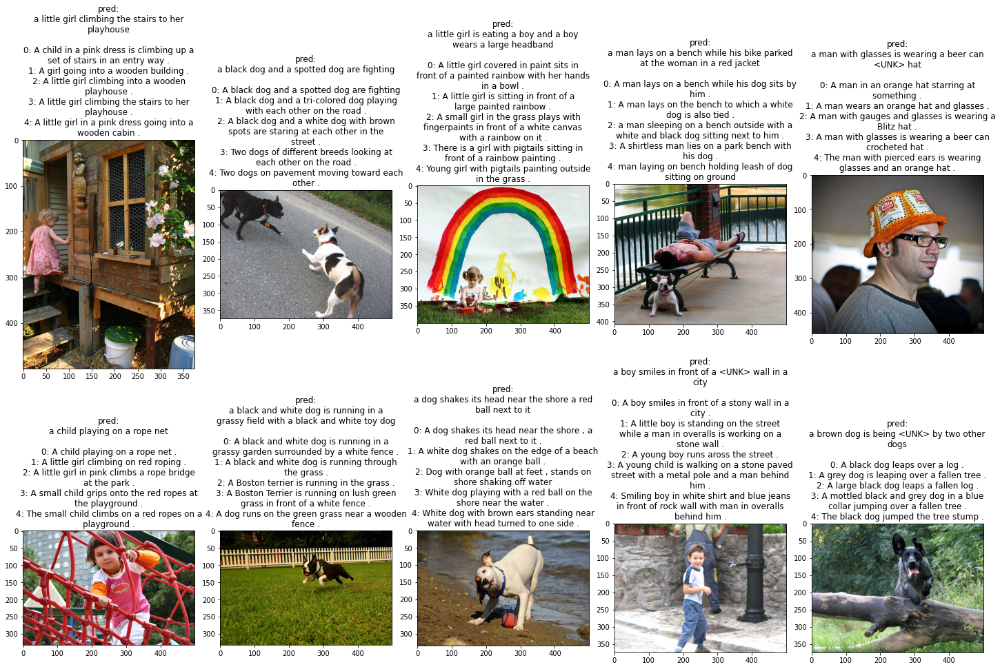

In [262]:
inds = list(range(10))
split = 'train'

h, w = 2, 5
title_width = 43

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['img_id']
    img = cv2.imread(os.path.join(data_folder, split, img_id))

    _, pred_caption = generate(model, img)
    pred_caption = wrap_text(pred_caption, title_width)

    captions = [row[f'caption #{i}'] for i in range(5)]
    caption_adjasted = "\n".join([f"{i}: " + wrap_text(caption, title_width) for i, caption in enumerate(captions)])

    caption = 'pred:\n' + pred_caption + '\n\n' + caption_adjasted

    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(img)

fig.tight_layout()
plt.show()

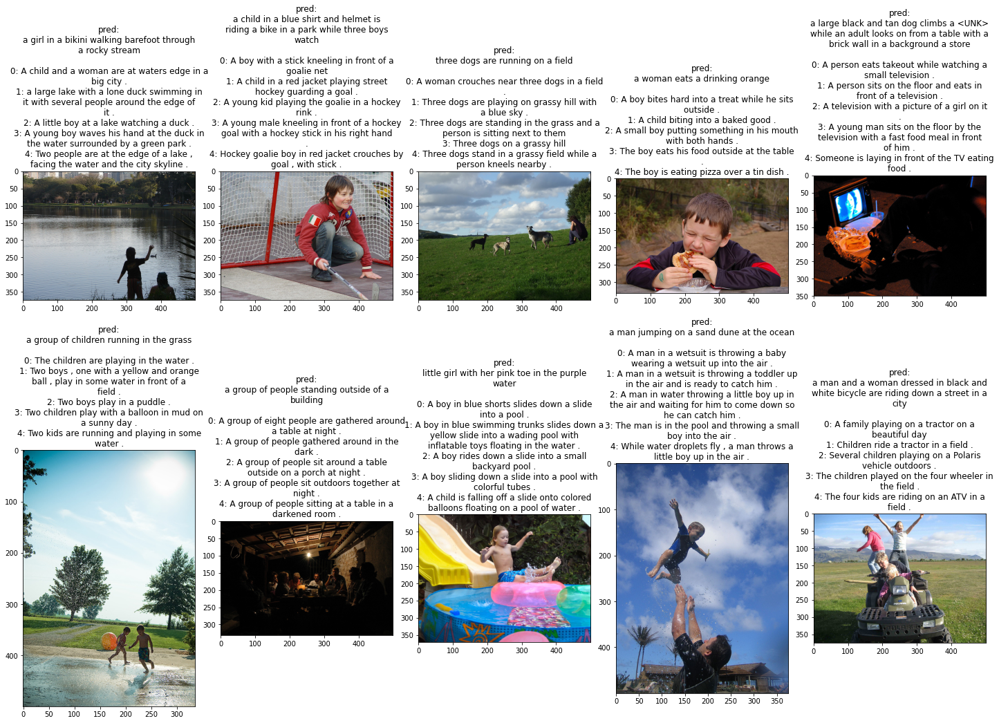

In [263]:
inds = list(range(10))
split = 'val'

h, w = 2, 5
title_width = 43

top_p = None
top_k = 3

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['img_id']
    img = cv2.imread(os.path.join(data_folder, split, img_id))

    _, pred_caption = generate(model, img)
    pred_caption = wrap_text(pred_caption, title_width)

    captions = [row[f'caption #{i}'] for i in range(5)]
    caption_adjasted = "\n".join([f"{i}: " + wrap_text(caption, title_width) for i, caption in enumerate(captions)])

    caption = 'pred:\n' + pred_caption + '\n\n' + caption_adjasted

    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(img)

fig.tight_layout()
plt.show()

### 4.3 BLEU на всём val датасете

In [264]:
from torchtext.data.metrics import bleu_score

def get_bleu(model, top_p=None, top_k=None, split="val"):
    candidates = []
    references = []
    for ind, row in tqdm(dfs[split].iterrows(), total=dfs[split].shape[0]):
        img_id = row['img_id']
        img = cv2.imread(os.path.join(data_folder, split, img_id))
        references.append([tokenize(row[f'caption #{j}'])[1:-1] for j in range(5)])
        candidates.append(generate(model, img, top_p=top_p, top_k=top_k)[0])

    # Здесь считается взвешенный BLEU score по 1-4-граммам, оставьте именно так
    b1, b2, b3, b4 = (
        bleu_score(candidates, references, weights=(1, 0, 0, 0)),
        bleu_score(candidates, references, weights=(0, 1, 0, 0)),
        bleu_score(candidates, references, weights=(0, 0, 1, 0)),
        bleu_score(candidates, references, weights=(0, 0, 0, 1)),
    )
    return (
        # (b1, b2, b3, b4),
        (b1 + b2 + b3 + b4) / 4,  # Вам нужно добиться большого вот этого значения (см раздел 5.)
        # bleu_score(candidates, references),
    )

In [ ]:
# В том числе экспериментируйте с top_p, top_k и прочим
bleu_res = get_bleu(model, top_p=None, top_k=None)
print(bleu_res)

  0%|          | 0/1000 [00:00<?, ?it/s]

## 5. Эксперименты (***3+ баллов***)

В этой части у вас не будет никакого написанного мною кода, а всё что вы здесь будете делать - на ваше усмотрение и по вашей задумке

Цель эксперментов:
**Пройти порог BLEU score на валидации (только делайте это честно, если где-то валидация будет протекать в обучение - 0 баллов за всё задание не думая)**

В блоке 4.3 при подсчёте BLEU на Val датасете вам нужно преодолеть следующие пороги:

**0.1** --> **1 балл**

**0.2** --> **2 балла**

**0.3** --> **3 балла**

В зависимости от решений других студентов пороги могут измениться, а за самые лучшие решения мы можем добавить дополнительные баллы.

**Важно:**
1. Процесс обучения данной модели должен находиться в данном ноутбуке в разделах 1-5, чтобы мы видели что чекпоинт правда ваш и написан/обучен вами.
2. Все эксперименты должны быть задокументированы: что вы пробовали, почему, какие результаты получили. Старайтесь максимально качественно описывать все свои эксперименты, потому что за отсутствие или за низкого качества описания экспериментов могут сниматься баллы.

___Рисуйте графики, таблицы, не забывайте про то, что несколько графиков можно уместить в одном поле вывода, подписывайте оси, пишите заголовки.___

___Простой тест для самих себя - откройте свой ноутбук и дальше читайте только markdown-поля и выводы ячеек, но не сами ячейки с кодом.___

___Если, сделав это, вы не смогли понять что делалось в ноутбуке и какие результаты были получены - что-то явно не так и такого рода работа точно является кандидатом под снижение баллов за оформление и документацию экспериментов.___

___Так же старайтесь сделать оформление работы чистым при сдаче - мы можем снизить баллы, если общее качество оформления будет низким, т.к. проверять работы мы будем вручную.___

___Сдавая задание в lk - присылайте уже сконвертированный в pdf ноутбук (нам его нужно читать, а не запускать) и выписывайте в комментарии к файлу максимально полученное значение blue на валидации (это же значение должно быть внутри самого ноутбука). Так нам будет проще считать поправки к порогам на оценки, если таковые понадобятся.___

**Удачи!**